<span style= 'font.family:verdana'>Partim_REGRESSION ANALYSIS</span>.


### Data Preprocessing and Exploratory Analysis

In [1]:
import pandas as pd
import numpy as np
from pandas import Series, DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy import stats
%matplotlib inline

In [2]:
mdata=pd.read_csv('music_data.csv', sep=',')
print(mdata.head())
print(mdata.shape)
meta=pd.read_csv('metadata.csv', sep=',')
print(meta.head())
print(meta.shape)

   track_id  chroma_cens_kurtosis_01  chroma_cens_kurtosis_02  \
0         2                 7.180653                 5.230309   
1         3                 1.888963                 0.760539   
2         5                 0.527563                -0.077654   
3        10                 3.702245                -0.291193   
4        20                -0.193837                -0.198527   

   chroma_cens_kurtosis_03  chroma_cens_kurtosis_04  chroma_cens_kurtosis_05  \
0                 0.249321                 1.347620                 1.482478   
1                 0.345297                 2.295201                 1.654031   
2                -0.279610                 0.685883                 1.937570   
3                 2.196742                -0.234449                 1.367364   
4                 0.201546                 0.258556                 0.775204   

   chroma_cens_kurtosis_06  chroma_cens_kurtosis_07  chroma_cens_kurtosis_08  \
0                 0.531371                 1.481

In [3]:
print(mdata.columns)
print(meta.columns)

Index(['track_id', 'chroma_cens_kurtosis_01', 'chroma_cens_kurtosis_02',
       'chroma_cens_kurtosis_03', 'chroma_cens_kurtosis_04',
       'chroma_cens_kurtosis_05', 'chroma_cens_kurtosis_06',
       'chroma_cens_kurtosis_07', 'chroma_cens_kurtosis_08',
       'chroma_cens_kurtosis_09',
       ...
       'tonnetz_std_04', 'tonnetz_std_05', 'tonnetz_std_06', 'zcr_kurtosis_01',
       'zcr_max_01', 'zcr_mean_01', 'zcr_median_01', 'zcr_min_01',
       'zcr_skew_01', 'zcr_std_01'],
      dtype='object', length=519)
Index(['track_id', 'album_comments', 'album_date_created',
       'album_date_released', 'album_engineer', 'album_favorites', 'album_id',
       'album_information', 'album_listens', 'album_producer', 'album_tags',
       'album_title', 'album_tracks', 'album_type', 'artist_active_year_begin',
       'artist_active_year_end', 'artist_associated_labels', 'artist_bio',
       'artist_comments', 'artist_date_created', 'artist_favorites',
       'artist_id', 'artist_latitude', 'ar

In [4]:
output_features=meta[['track_listens','album_date_released']]

In [5]:
music=mdata.join(output_features) ## adding the output features to the mdata

In [6]:
music= music.drop('track_id', axis=1)
print(music.shape)
print(music.columns)

(106574, 520)
Index(['chroma_cens_kurtosis_01', 'chroma_cens_kurtosis_02',
       'chroma_cens_kurtosis_03', 'chroma_cens_kurtosis_04',
       'chroma_cens_kurtosis_05', 'chroma_cens_kurtosis_06',
       'chroma_cens_kurtosis_07', 'chroma_cens_kurtosis_08',
       'chroma_cens_kurtosis_09', 'chroma_cens_kurtosis_10',
       ...
       'tonnetz_std_06', 'zcr_kurtosis_01', 'zcr_max_01', 'zcr_mean_01',
       'zcr_median_01', 'zcr_min_01', 'zcr_skew_01', 'zcr_std_01',
       'track_listens', 'album_date_released'],
      dtype='object', length=520)


giving that the data is too large which will be computer intensive. we are going to sample the data ramdomly. According to Tabachnick and fidell (1996, pg132) sample size>50+8*m. where m is the number of independent variable
from our calculation our sample must be greater than 4000(frac=0.04). so we will consider a frac=0.05 

In [7]:
### to ensure reproducibility we use the random state zero
data=music.sample(frac=0.05, random_state=0)
print(data.head)
data.shape

<bound method NDFrame.head of         chroma_cens_kurtosis_01  chroma_cens_kurtosis_02  \
80954                  0.193511                 0.281533   
97841                 -0.345391                 0.534547   
93719                 -0.259741                -0.550599   
103653                -0.148740                -0.965083   
46028                  0.171561                 0.025517   
...                         ...                      ...   
6903                   1.484898                 2.254299   
63893                 -0.525403                -0.251578   
93518                 -0.408156                -0.309331   
81330                  0.602447                -0.099120   
86997                 -1.097779                -0.863964   

        chroma_cens_kurtosis_03  chroma_cens_kurtosis_04  \
80954                 -0.517525                -0.587515   
97841                 -0.156564                -0.707366   
93719                 -0.299593                 0.342165   
103653   

(5329, 520)

In [8]:
## checking for missing values
data.isnull().sum().sort_values(ascending=False)

album_date_released        1852
mfcc_skew_06                  0
mfcc_skew_04                  0
mfcc_skew_03                  0
mfcc_skew_02                  0
                           ... 
chroma_stft_kurtosis_01       0
chroma_cqt_std_12             0
chroma_cqt_std_11             0
chroma_cqt_std_10             0
mfcc_kurtosis_09              0
Length: 520, dtype: int64

In [9]:
## to check the different point at which we find missing value in album_date_released 
data[data.album_date_released.isnull()]

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01,track_listens,album_date_released
97841,-0.345391,0.534547,-0.156564,-0.707366,0.613957,0.176181,-0.221675,0.059568,-0.694602,-0.038627,...,0.020687,0.605567,0.220703,0.059020,0.047363,0.000000,1.024775,0.041243,3368,NaN
46028,0.171561,0.025517,-0.180407,-0.191088,0.265154,0.167380,3.315781,0.969577,0.730078,0.108710,...,0.020532,1.997491,0.475586,0.094146,0.058594,0.000000,1.502114,0.087465,1173,NaN
1531,0.452109,-0.834028,-0.581804,-0.074117,-0.378644,-0.472600,-0.826434,-0.735898,-0.522516,-0.374305,...,0.017760,43.169136,0.723633,0.061920,0.043457,0.002930,6.131421,0.083442,376,NaN
99121,0.171316,-0.088138,1.045061,1.556388,1.064216,1.262783,0.151072,1.640472,1.702385,2.372707,...,0.017575,3.448006,0.293945,0.084448,0.086426,0.010742,0.905595,0.033744,1258,NaN
14961,-0.044371,-0.816634,-0.293097,0.596385,-0.243717,-0.788154,-0.144834,0.562969,0.267802,1.347371,...,0.018915,20.226921,0.288574,0.028303,0.017090,0.000000,4.066301,0.035744,394,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40814,0.174224,-0.578730,-0.594539,-0.910224,-0.929747,-0.980893,2.178141,2.385567,-0.898135,0.042556,...,0.021583,0.005239,0.100586,0.036450,0.035645,0.003906,0.407045,0.013056,74,NaN
11046,-0.856808,0.090062,0.994725,1.349626,-1.177833,-1.263348,0.151252,-1.104614,-0.776860,-0.256952,...,0.024050,1.767337,0.282715,0.047657,0.038086,0.000000,1.214458,0.038674,313,NaN
55728,0.707107,-0.331632,0.185387,0.107390,0.440895,0.510953,-0.055311,-0.094767,-0.115789,-0.370251,...,0.017011,2.474725,0.476562,0.070976,0.044434,0.000000,1.711286,0.065929,370,NaN
20343,-0.967740,-1.127880,-1.255576,-0.868696,-1.171987,-0.031338,0.183748,-0.390546,-0.212449,-0.723193,...,0.021613,17.707041,0.363281,0.036115,0.025879,0.000000,3.809325,0.039072,316,NaN


In [10]:
### checking for duplicated data
data.duplicated().sum()

0

**From the data exploration we can conclude that music data predictors has no missing value except for one of the labels(album_date_released )and no duplicate was found. from this we can conclude that we carryout a supervised and a semi supervised machine learning models for this project.

In [11]:
##summary statistics##
data.describe()

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_05,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01,track_listens
count,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,...,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000
mean,0.173648,0.140640,0.416868,0.193511,0.254946,0.333542,0.587347,0.953107,0.273854,0.315697,...,0.021545,0.021807,29.886416,0.378444,0.052279,0.043256,0.002347,3.243812,0.040036,2107.376431
std,1.810900,3.460466,9.223288,3.939673,4.712096,7.142986,32.832958,53.035179,7.982694,5.020021,...,0.006124,0.006153,83.081058,0.182686,0.033187,0.033079,0.006022,3.015656,0.027362,5931.239862
min,-1.859782,-1.856905,-1.869149,-1.806917,-1.811909,-1.902058,-1.829760,-1.836731,-1.795678,-1.873126,...,0.005901,0.004520,-1.677419,0.023926,0.001866,0.000000,0.000000,-4.785390,0.001067,2.000000
25%,-0.631635,-0.654344,-0.633937,-0.637246,-0.663171,-0.617407,-0.639705,-0.617661,-0.657192,-0.649086,...,0.017232,0.017482,3.442542,0.243652,0.032452,0.024902,0.000000,1.420723,0.021478,293.000000
50%,-0.170039,-0.205678,-0.160234,-0.186295,-0.200087,-0.152537,-0.184457,-0.133287,-0.189433,-0.166137,...,0.020627,0.020840,9.850470,0.355957,0.046715,0.037109,0.000000,2.428612,0.033252,741.000000
75%,0.477568,0.440341,0.557714,0.445846,0.479802,0.536244,0.486349,0.578016,0.474265,0.529622,...,0.025086,0.025116,27.684193,0.467773,0.063805,0.053711,0.003418,4.170532,0.050871,2008.000000
max,41.982716,217.670364,525.912537,231.880295,259.442993,447.825378,2394.002686,3869.482178,443.855347,219.587036,...,0.073108,0.086993,2247.413330,0.999512,0.658522,0.769531,0.216309,38.633812,0.344076,211397.000000


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5329 entries, 80954 to 86997
Columns: 520 entries, chroma_cens_kurtosis_01 to album_date_released
dtypes: float64(518), int64(1), object(1)
memory usage: 21.2+ MB


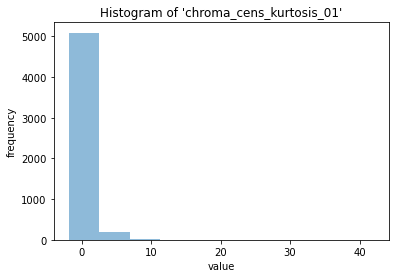

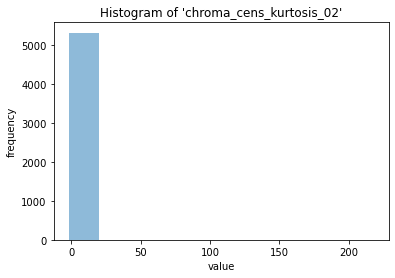

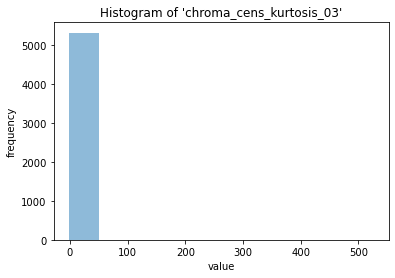

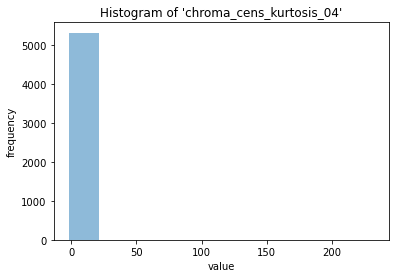

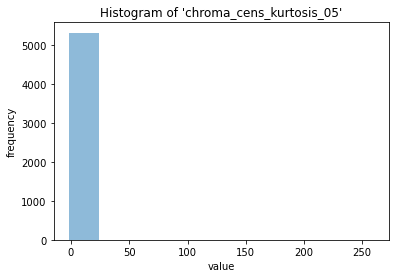

...

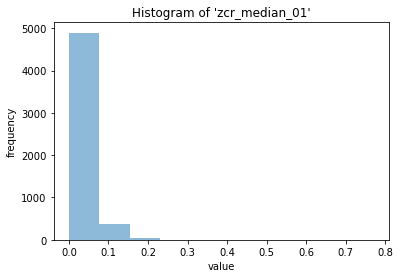

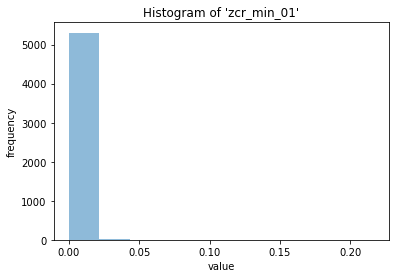

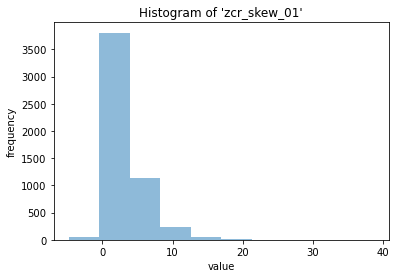

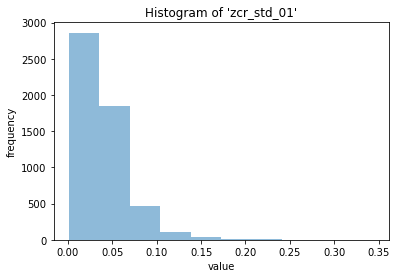

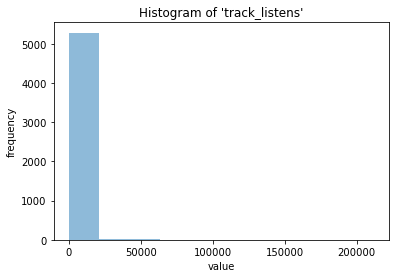

In [13]:
## visualising the shape of the distribution of each feature. ie identifying if normal or skewed
def plot_histogram(x):
    for columns in x:
        plt.hist(x[columns],alpha=0.5)
        plt.title("Histogram of '{var_name}'".format(var_name=x[columns].name))
        plt.xlabel('value')
        plt.ylabel('frequency')
        plt.show()    

plot_histogram(data.iloc[:,:-1])

In [14]:
### renaming the features
for c in data.columns:
    #data[c].rename(columns = lambda x : 'v_' + x)
    cols = data.columns.tolist()
    data.columns = cols[:0] + ['v_%i' % i for i in range(1, len(cols[0:])+1)]
    
    print(data.columns)

Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...

      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7'

      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7'

      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517', 'v_518',
       'v_519', 'v_520'],
      dtype='object', length=520)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7'

In [15]:
##v_520 is the album date release output
data1=data.drop('v_520', axis=1)
skf=data1.skew()
skf=skf[abs(skf)>0.5].index
skf

Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=323)

In [16]:
data1[skf]=np.log1p(abs(data1[skf]))
data1

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
80954,0.176899,0.248057,0.417081,0.462170,0.369629,0.253094,0.397753,0.760522,0.832058,0.719650,...,0.026175,0.027255,1.118683,0.137552,0.034581,0.033609,0.000000,0.469415,0.015432,5.375278
97841,0.296685,0.428235,0.145453,0.534952,0.478689,0.162273,0.200223,0.057861,0.527448,0.037899,...,0.024179,0.020476,0.473477,0.199427,0.057344,0.046276,0.000000,0.705458,0.040415,8.122371
93719,0.230906,0.438642,0.262051,0.294284,0.219595,0.702700,0.989809,0.406294,0.478466,0.088708,...,0.024099,0.026449,4.071554,0.516571,0.029146,0.015504,0.000488,1.954538,0.046341,4.804021
103653,0.138666,0.675534,0.627549,0.260249,0.749674,1.820737,1.695086,0.111573,1.090277,0.601762,...,0.032176,0.020932,4.017667,0.218445,0.014187,0.011651,0.002438,2.068279,0.016866,7.758761
46028,0.158337,0.025196,0.165860,0.174867,0.235194,0.154762,1.462278,0.677819,0.548167,0.103197,...,0.017324,0.020324,1.097775,0.389055,0.089974,0.056941,0.000000,0.917136,0.083849,7.068172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6903,0.910232,1.179977,1.486832,1.328379,1.272783,1.260640,1.294259,2.104410,1.163240,0.261370,...,0.015462,0.013007,1.487023,0.235566,0.050569,0.047673,0.000000,0.683467,0.023414,5.564520
63893,0.422259,0.224405,0.155788,0.279967,0.483630,0.016886,0.283546,0.674671,0.568181,0.248636,...,0.019384,0.021115,1.764835,0.266338,0.064675,0.061543,0.003899,0.856638,0.034386,7.340187
93518,0.342281,0.269517,0.360601,0.265906,0.573962,0.054760,0.365763,0.268488,0.209873,0.629217,...,0.018173,0.016567,2.362004,0.384744,0.075228,0.070229,0.000000,1.024825,0.033542,6.922644
81330,0.471532,0.094510,0.437599,0.557519,0.260814,0.508337,0.295440,0.689695,0.547136,0.638629,...,0.015703,0.015617,1.708653,0.291459,0.038598,0.023644,0.001464,1.080465,0.038437,8.563122


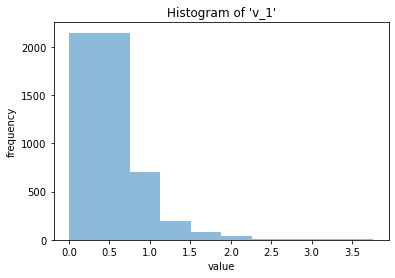

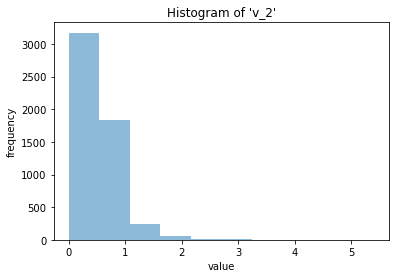

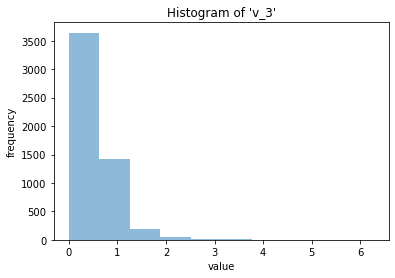

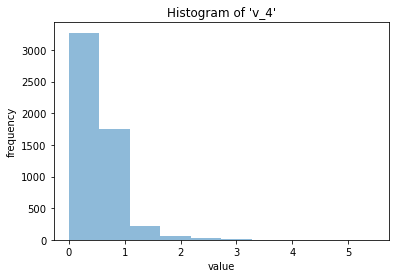

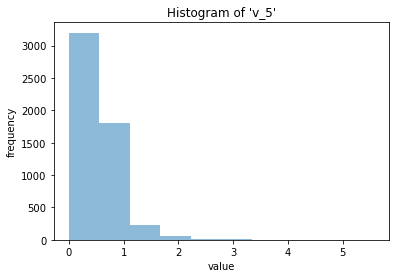

...

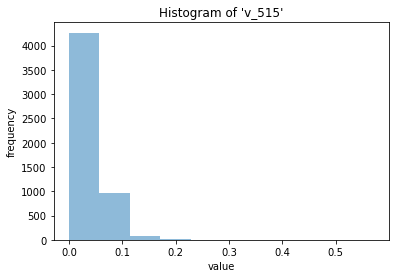

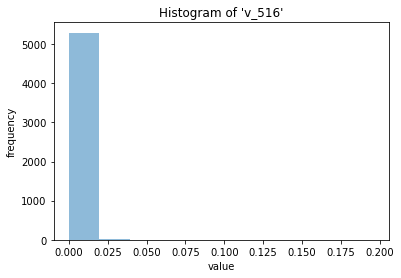

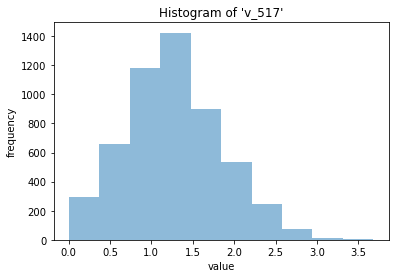

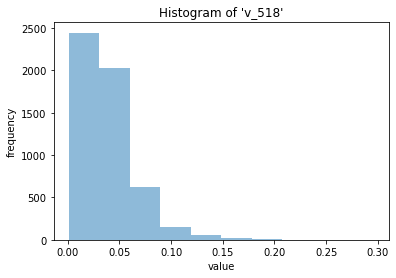

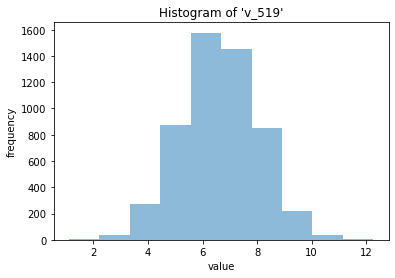

In [17]:
### identifying the impact of log transformation
def plot_histogram(x):
    for columns in x:
        plt.hist(x[columns],alpha=0.5)
        plt.title("Histogram of '{var_name}'".format(var_name=x[columns].name))
        plt.xlabel('value')
        plt.ylabel('frequency')
        plt.show()    

plot_histogram(data1)

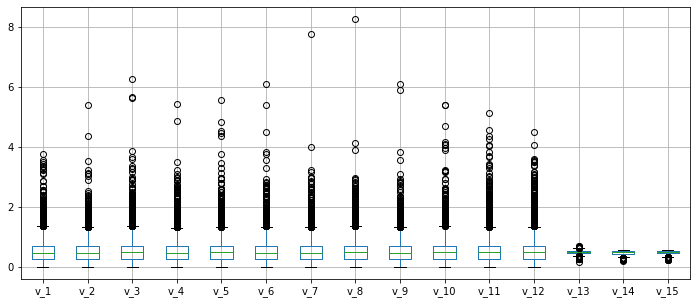

In [18]:
### identifying outliers from box plot with IQR for some few features
import seaborn as sns
boxplot=data1.iloc[:,0:15].boxplot(figsize=(12,5))

In [19]:
#### data values found out of the range is label true and consider an outlier therefore has to be remove
#for column in data1:
Q1 = data1.quantile(0.25)
Q3 = data1.quantile(0.75)
IQR = Q3 - Q1
#print(IQR)
print((data1< (Q1 - 1.5 * IQR)) | (data1> (Q3 + 1.5 * IQR)))

          v_1    v_2    v_3    v_4    v_5    v_6    v_7    v_8    v_9   v_10  \
80954   False  False  False  False  False  False  False  False  False  False   
97841   False  False  False  False  False  False  False  False  False  False   
93719   False  False  False  False  False  False  False  False  False  False   
103653  False  False  False  False  False   True   True  False  False  False   
46028   False  False  False  False  False  False   True  False  False  False   
...       ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
6903    False  False   True   True  False  False  False   True  False  False   
63893   False  False  False  False  False  False  False  False  False  False   
93518   False  False  False  False  False  False  False  False  False  False   
81330   False  False  False  False  False  False  False  False  False  False   
86997   False  False  False  False  False  False  False  False  False  False   

        ...  v_510  v_511  v_512  v_513

In [20]:
## using the below to remove outlier. the result showed excess reduction number of observation. we poceed with treatment
#data2 = data1[~((data1 < (Q1 - 1.5 * IQR)) |(data1> (Q3 + 1.5 * IQR))).any(axis=1)]
#print(data2.shape)

##outlier treatment: when outlier is been remove we observe large amount of data been remove which as a result can affect
##our model and thus treating the outlier without removal will be the best. so we replace the outliers with median values
##In this technique, we replace the extreme values with median values. It is advised to not use mean values as they are ##affectedby outliers.
##The first line of code below prints the 50th percentile value, or the median. The second line prints the 95th percentile value. The third line of code below replaces all those values in the 'column' variable, which are greater than the 95th percentile, with the median value. Finally, the fourth line prints summary statistics after all these techniques have been employed for outlier treatment.

In [21]:
for column in data1:
    m1=data1[column].quantile(0.50) 
    p1=data1[column].quantile(0.95)
    data1[column] = np.where(data1[column] > p1, m1, data1[column])
data1.describe()
data1

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
80954,0.176899,0.248057,0.417081,0.462170,0.369629,0.253094,0.397753,0.760522,0.832058,0.719650,...,0.026175,0.027255,1.118683,0.137552,0.034581,0.033609,0.000000,0.469415,0.015432,5.375278
97841,0.296685,0.428235,0.145453,0.534952,0.478689,0.162273,0.200223,0.057861,0.527448,0.037899,...,0.024179,0.020476,0.473477,0.199427,0.057344,0.046276,0.000000,0.705458,0.040415,8.122371
93719,0.230906,0.438642,0.262051,0.294284,0.219595,0.702700,0.989809,0.406294,0.478466,0.088708,...,0.024099,0.026449,4.071554,0.516571,0.029146,0.015504,0.000488,1.954538,0.046341,4.804021
103653,0.138666,0.675534,0.627549,0.260249,0.749674,0.463852,0.463390,0.111573,1.090277,0.601762,...,0.020418,0.020932,4.017667,0.218445,0.014187,0.011651,0.002438,2.068279,0.016866,7.758761
46028,0.158337,0.025196,0.165860,0.174867,0.235194,0.154762,0.463390,0.677819,0.548167,0.103197,...,0.017324,0.020324,1.097775,0.389055,0.089974,0.056941,0.000000,0.917136,0.083849,7.068172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6903,0.910232,0.455949,0.475283,0.450055,0.475009,0.463852,0.463390,0.472201,1.163240,0.261370,...,0.015462,0.013007,1.487023,0.235566,0.050569,0.047673,0.000000,0.683467,0.023414,5.564520
63893,0.422259,0.224405,0.155788,0.279967,0.483630,0.016886,0.283546,0.674671,0.568181,0.248636,...,0.019384,0.021115,1.764835,0.266338,0.064675,0.061543,0.003899,0.856638,0.034386,7.340187
93518,0.342281,0.269517,0.360601,0.265906,0.573962,0.054760,0.365763,0.268488,0.209873,0.629217,...,0.018173,0.016567,2.362004,0.384744,0.075228,0.070229,0.000000,1.024825,0.033542,6.922644
81330,0.471532,0.094510,0.437599,0.557519,0.260814,0.508337,0.295440,0.689695,0.547136,0.638629,...,0.015703,0.015617,1.708653,0.291459,0.038598,0.023644,0.001464,1.080465,0.038437,8.563122


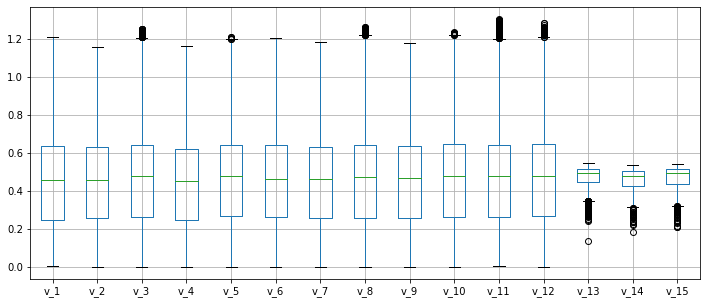

In [22]:
### identifying outliers from box plot for some few features after treatment
import seaborn as sns
boxplot=data1.iloc[:,0:15].boxplot(figsize=(12,5))

In [23]:
### normilisation of data
from sklearn import preprocessing
x = data1.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data3 = pd.DataFrame(x_scaled, columns=data1.columns)
data3

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
0,0.145815,0.214126,0.332872,0.398112,0.305715,0.210275,0.335315,0.602736,0.706503,0.582754,...,0.778300,0.803975,0.234773,0.209697,0.338887,0.394754,0.000000,0.202432,0.169332,0.548558
1,0.244726,0.369723,0.116043,0.460807,0.395934,0.134794,0.168740,0.045795,0.447822,0.030673,...,0.701750,0.564357,0.099144,0.323606,0.574665,0.543540,0.000000,0.305188,0.463791,0.900921
2,0.190410,0.378710,0.209118,0.253495,0.181599,0.583942,0.834589,0.321969,0.406226,0.071818,...,0.698692,0.775484,0.855497,0.907450,0.282593,0.182107,0.052862,0.848945,0.533640,0.475284
3,0.114244,0.583285,0.500880,0.224177,0.620107,0.385436,0.390666,0.088368,0.925787,0.487288,...,0.557473,0.580467,0.844170,0.358617,0.127640,0.136844,0.264055,0.898459,0.186232,0.854282
4,0.130487,0.021668,0.132332,0.150629,0.194503,0.128552,0.390666,0.537184,0.465417,0.083551,...,0.438801,0.558988,0.230378,0.672701,0.912651,0.668814,0.000000,0.397337,0.975730,0.765702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5324,0.751355,0.393657,0.379333,0.387676,0.392890,0.385436,0.390666,0.374208,0.987749,0.211640,...,0.367407,0.300369,0.312202,0.390136,0.504487,0.559956,0.000000,0.295615,0.263407,0.572832
5325,0.348417,0.193701,0.124292,0.241163,0.400022,0.013963,0.239006,0.534689,0.482413,0.201327,...,0.517810,0.586965,0.370601,0.446785,0.650601,0.722866,0.422179,0.371000,0.392727,0.800592
5326,0.282377,0.232658,0.287786,0.229050,0.474749,0.045440,0.308338,0.212742,0.178132,0.509521,...,0.471377,0.426205,0.496132,0.664764,0.759905,0.824886,0.000000,0.444217,0.382780,0.747035
5327,0.389104,0.081526,0.349251,0.480246,0.215697,0.422407,0.249035,0.546598,0.464542,0.517143,...,0.376632,0.392626,0.358791,0.493032,0.380493,0.277715,0.158510,0.468438,0.440483,0.957455


### Data partioning and supervised machine learning

The 10 fold cross validation is to avoid over fitting of the model that is we want more accurate estimate of sample data. In summary to evaluate the performance of our model

In [24]:
### importing library
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn import model_selection
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

In [25]:
##Data partioning
X = data3.drop('v_519',axis=1)
y = data3['v_519']
##splitting the data in to test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
##building the model
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(4263, 518) (1066, 518) (4263,) (1066,)


In [26]:
# prepare models
models = []
models.append(('LR', LinearRegression()))
models.append(('PLS', PLSRegression()))
models.append(('RR', Ridge()))
models.append(('LS', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('RF', RandomForestRegressor()))

In [27]:
# evaluate each model in turn
results = []
names = []
scoring = 'neg_mean_squared_error'
for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state=None)
    mse_cv = model_selection.cross_val_score(model,X_train,y_train, cv=kfold, scoring=scoring)
    results.append(mse_cv)
    names.append(name)
    msg = "%s: %.3f,%.3f,%.3f" % (name, mse_cv.mean(),mse_cv.var(), mse_cv.std())
    print(msg)

LR: -0.027,0.000,0.002
PLS: -0.023,0.000,0.001
RR: -0.025,0.000,0.001
LS: -0.025,0.000,0.001
EN: -0.025,0.000,0.001
RF: -0.023,0.000,0.001


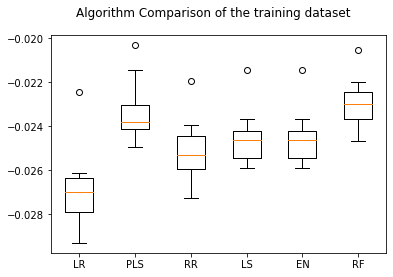

In [28]:
###plotting the algorithm compariso in a box plot
fig = plt.figure(edgecolor='green')
fig.suptitle('Algorithm Comparison of the training dataset')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

our baseline model will be Random Forest which has the lowest MSE

### Dimensionality Reduction

-It eliminates noise and redundant features.
-It helps improve the model’s accuracy and performance. 
-It facilitates the usage of algorithms that are unfit for more substantial dimensions. 
-It reduces the amount of storage space required (less data needs lesser storage space).
-It compresses the data, which reduces the computation time and facilitates faster training of the data.

In [29]:
##Feature selection: Pearson Correlation
### using the train and test model above
X_train.corr()

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_509,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518
v_1,1.000000,0.224425,0.143516,0.121064,0.125735,0.122207,0.069677,0.111422,0.085195,0.131659,...,0.044860,0.050689,0.038199,0.007903,-0.054130,-0.062685,-0.051119,0.040496,-0.000797,-0.057490
v_2,0.224425,1.000000,0.215045,0.170223,0.135518,0.123047,0.133055,0.107000,0.153915,0.120487,...,0.049039,0.055245,0.038750,0.015135,-0.038956,-0.072561,-0.075027,-0.002350,0.014640,-0.042656
v_3,0.143516,0.215045,1.000000,0.232142,0.154738,0.127549,0.107020,0.106910,0.099651,0.119026,...,0.033893,0.021248,0.018466,-0.008116,-0.032256,-0.066426,-0.064413,-0.016941,-0.010281,-0.045792
v_4,0.121064,0.170223,0.232142,1.000000,0.232788,0.157652,0.094508,0.103780,0.155198,0.108566,...,0.050573,0.038225,0.054204,0.012558,-0.042653,-0.087592,-0.066913,-0.015385,0.015057,-0.060416
v_5,0.125735,0.135518,0.154738,0.232788,1.000000,0.261922,0.150998,0.121934,0.116445,0.143340,...,0.067575,0.051519,0.077561,0.013206,-0.026165,-0.073139,-0.062912,0.013579,0.018070,-0.048856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
v_514,-0.062685,-0.072561,-0.066426,-0.087592,-0.073139,-0.030348,-0.052589,-0.039010,-0.036221,-0.045450,...,-0.201897,-0.316936,-0.307547,-0.351183,0.283715,1.000000,0.853357,0.054714,-0.310710,0.541071
v_515,-0.051119,-0.075027,-0.064413,-0.066913,-0.062912,-0.032575,-0.050382,-0.029097,-0.038906,-0.044506,...,-0.194188,-0.318407,-0.315882,-0.362140,0.125754,0.853357,1.000000,0.093527,-0.382194,0.295756
v_516,0.040496,-0.002350,-0.016941,-0.015385,0.013579,-0.008090,-0.035272,0.005503,-0.010535,-0.003197,...,0.048598,-0.023759,-0.021039,0.039823,0.008691,0.054714,0.093527,1.000000,0.027557,-0.019391
v_517,-0.000797,0.014640,-0.010281,0.015057,0.018070,-0.009544,0.012172,-0.012020,-0.017085,0.001169,...,0.177261,0.225327,0.214276,0.906290,0.434070,-0.310710,-0.382194,0.027557,1.000000,0.114031


In [30]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [31]:
corr_features = correlation(X_train, 0.7)
len(set(corr_features))

166

In [32]:
## dropping correlated futures out from the test and train
X_trainp=X_train.drop(corr_features,axis=1)
X_testp=X_test.drop(corr_features,axis=1)

In [33]:
### usinf our baseline model RF
RF=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_trainp,y_train)

In [34]:
## evaluating training model
RF.score(X_trainp,y_train)
ytrp_pred=RF.predict(X_trainp)
ytep_pred=RF.predict(X_testp)

In [35]:
##evaluating on train
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, ytrp_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train, ytrp_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train, ytrp_pred)))
print('R-2:', metrics.r2_score(y_train, ytrp_pred))

Mean Absolute Error: 0.12167666694735702
Mean Square Error: 0.023206030395523162
Root Mean Square Error: 0.15233525657418628
R-2: 0.05323468615934368


In [36]:
## evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, ytep_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test, ytep_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test, ytep_pred)))
print('R-2:', metrics.r2_score(y_test, ytep_pred))

Mean Absolute Error: 0.1299339847731078
Mean Square Error: 0.026340012296988576
Root Mean Square Error: 0.16229606371378383
R-2: 0.022432366086042932


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


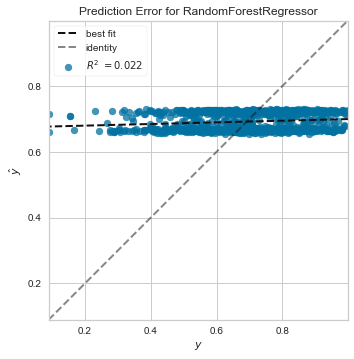

<AxesSubplot:title={'center':'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [37]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser=PredictionError(RF)
visualiser.fit(X_trainp,y_train)
visualiser.score(X_testp,y_test)
visualiser.poof()

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


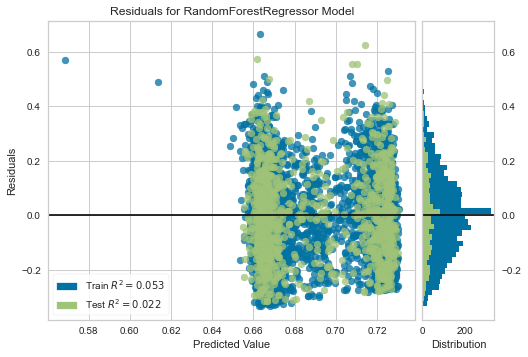

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [38]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer=ResidualsPlot(RF)
visualizer.fit(X_trainp,y_train)
visualizer.score(X_testp,y_test)
visualizer.poof()

In [39]:
### decision tree plot
#from sklearn import tree
#plt.figure(figsize=(80,20))
#clf = tree.DecisionTreeRegressor()
#clf = clf.fit(X_trainp, y_train)
#plot_tree(clf, max_depth=2, feature_names=X_trainp.columns, filled=True);
#clf

In [40]:
#from sklearn.model_selection import GridSearchCV
#random_forest_tuning=RandomForestRegressor(random_state=0)
#param_grid={
#    'n_estimators':[100,200,300],
#    'max_depth':[2,3,4,5],
#    }
#search=GridSearchCV(estimator=random_forest_tuning,
#                    param_grid=param_grid, 
#                    cv=5
#                   )
#search.fit(X_train, y_train)
#search.best_params_


In [41]:
##Feature selection: LASSO
### using the train and test model above
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

In [42]:
pipeline=Pipeline([('scaler', StandardScaler()), ('model',Lasso())])

In [43]:
search=GridSearchCV(pipeline,
                    {'model__alpha':np.arange(0.1,10,0.1)}, 
                    cv=10, 
                    scoring='neg_mean_squared_error', 
                    verbose=3
                   )

In [44]:
search.fit(X_train, y_train)

Fitting 10 folds for each of 99 candidates, totalling 990 fits
[CV 1/10] END ................model__alpha=0.1;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=0.1;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=0.1;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=0.1;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=0.1;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=0.1;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=0.1;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=0.1;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=0.1;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=0.1;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=0.2;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=0.2

[CV 3/10] END ................model__alpha=1.1;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=1.1;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=1.1;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=1.1;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=1.1;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=1.1;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=1.1;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=1.1;, score=-0.024 total time=   0.0s
[CV 1/10] END .model__alpha=1.2000000000000002;, score=-0.024 total time=   0.0s
[CV 2/10] END .model__alpha=1.2000000000000002;, score=-0.026 total time=   0.0s
[CV 3/10] END .model__alpha=1.2000000000000002;, score=-0.025 total time=   0.0s
[CV 4/10] END .model__alpha=1.2000000000000002;, score=-0.024 total time=   0.0s
[CV 5/10] END .model__alpha=

[CV 6/10] END ................model__alpha=2.1;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=2.1;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=2.1;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=2.1;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=2.1;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=2.2;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=2.2;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=2.2;, score=-0.025 total time=   0.1s
[CV 4/10] END ................model__alpha=2.2;, score=-0.024 total time=   0.1s
[CV 5/10] END ................model__alpha=2.2;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=2.2;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=2.2;, score=-0.021 total time=   0.0s
[CV 8/10] END ..............

[CV 8/10] END ................model__alpha=3.1;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=3.1;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=3.1;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=3.2;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=3.2;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=3.2;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=3.2;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=3.2;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=3.2;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=3.2;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=3.2;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=3.2;, score=-0.026 total time=   0.0s
[CV 10/10] END .............

[CV 1/10] END ................model__alpha=4.2;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=4.2;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=4.2;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=4.2;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=4.2;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=4.2;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=4.2;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=4.2;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=4.2;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=4.2;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=4.3;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=4.3;, score=-0.026 total time=   0.0s
[CV 3/10] END ..............

[CV 4/10] END ................model__alpha=5.2;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=5.2;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=5.2;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=5.2;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=5.2;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=5.2;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=5.2;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=5.3;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=5.3;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=5.3;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=5.3;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=5.3;, score=-0.025 total time=   0.0s
[CV 6/10] END ..............

[CV 6/10] END ................model__alpha=6.2;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=6.2;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=6.2;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=6.2;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=6.2;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=6.3;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=6.3;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=6.3;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=6.3;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=6.3;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=6.3;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=6.3;, score=-0.021 total time=   0.0s
[CV 8/10] END ..............

[CV 8/10] END ................model__alpha=7.2;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=7.2;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=7.2;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=7.3;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=7.3;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=7.3;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=7.3;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=7.3;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=7.3;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=7.3;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=7.3;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=7.3;, score=-0.026 total time=   0.0s
[CV 10/10] END .............

[CV 10/10] END ...............model__alpha=8.2;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=8.3;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=8.3;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=8.3;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=8.3;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=8.3;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=8.3;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=8.3;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=8.3;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=8.3;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=8.3;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=8.4;, score=-0.024 total time=   0.0s
[CV 2/10] END ..............

[CV 3/10] END ................model__alpha=9.3;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=9.3;, score=-0.024 total time=   0.0s
[CV 5/10] END ................model__alpha=9.3;, score=-0.025 total time=   0.0s
[CV 6/10] END ................model__alpha=9.3;, score=-0.024 total time=   0.0s
[CV 7/10] END ................model__alpha=9.3;, score=-0.021 total time=   0.0s
[CV 8/10] END ................model__alpha=9.3;, score=-0.026 total time=   0.0s
[CV 9/10] END ................model__alpha=9.3;, score=-0.026 total time=   0.0s
[CV 10/10] END ...............model__alpha=9.3;, score=-0.024 total time=   0.0s
[CV 1/10] END ................model__alpha=9.4;, score=-0.024 total time=   0.0s
[CV 2/10] END ................model__alpha=9.4;, score=-0.026 total time=   0.0s
[CV 3/10] END ................model__alpha=9.4;, score=-0.025 total time=   0.0s
[CV 4/10] END ................model__alpha=9.4;, score=-0.024 total time=   0.0s
[CV 5/10] END ..............

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', Lasso())]),
             param_grid={'model__alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9,
       4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2,
       5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5,
       6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8,
       7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1,
       9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])},
             scoring='neg_mean_squared_error', verbose=3)

In [45]:
search.best_params_

{'model__alpha': 0.1}

In [46]:
lasso=Lasso(alpha=0.1)
coeff=lasso.fit(X_train, y_train).coef_
coeff

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
       -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0.,  0., -0.,  0., -0.,  0.,
        0.,  0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0., -0.,  0.,  0.,  0.,  0., -0.,
        0., -0.,  0.,  0., -0., -0., -0., -0., -0.,  0., -0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0., -0.,
       -0.,  0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0., -0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0., -0.,  0., -0., -0., -0., -0., -0

In [47]:
features=np.array(X_train.columns)[coeff !=0]
len(features)
features

array([], dtype=object)

In [48]:
X_train_l=X_train[features]
X_test_l=X_test[features]
print(X_train_l.shape,X_test_l.shape)

(4263, 0) (1066, 0)


In [49]:
#X_train_l = scaler.fit_transform(X_train_l)
#X_test_l = scaler.fit_transform(X_test_l)

In [50]:
## Random forest
RFl=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_train_l,y_train)

ValueError: at least one array or dtype is required

In [ ]:
## evaluating training model
RFl.score(X_train_l,y_train)
ytrl_pred=RFl.predict(X_train_l)
ytel_pred=RFl.predict(X_test_l)

In [ ]:
#evaluating on train
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, ytrl_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train, ytrl_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train, ytrl_pred)))
print('R-2:', metrics.r2_score(y_train, ytrl_pred))

In [ ]:
#evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, ytel_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test, ytel_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test, ytel_pred)))
print('R-2:', metrics.r2_score(y_test, ytel_pred))

In [ ]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser1=PredictionError(RFl)
visualiser1.fit(X_train_l,y_train)
visualiser1.score(X_test_l,y_test)
visualiser1.poof()

In [ ]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer1=ResidualsPlot(RFl)
visualizer1.fit(X_train_l,y_train)
visualizer1.score(X_test_l,y_test)
visualizer1.poof()

In [51]:
### feature selection with Wrapper Method (step forward selection)
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [52]:
model=LinearRegression()
sfs=SFS(model,
        k_features=50,
        forward=True,
        scoring='neg_mean_squared_error',
       ).fit(X_train,y_train)

In [53]:
features1=list(sfs.k_feature_names_)
features1

['v_6',
 'v_11',
 'v_20',
 'v_22',
 'v_28',
 'v_31',
 'v_37',
 'v_70',
 'v_82',
 'v_125',
 'v_134',
 'v_143',
 'v_146',
 'v_157',
 'v_175',
 'v_179',
 'v_188',
 'v_193',
 'v_199',
 'v_201',
 'v_205',
 'v_208',
 'v_244',
 'v_247',
 'v_251',
 'v_254',
 'v_276',
 'v_297',
 'v_312',
 'v_313',
 'v_322',
 'v_339',
 'v_345',
 'v_358',
 'v_395',
 'v_397',
 'v_406',
 'v_421',
 'v_431',
 'v_433',
 'v_436',
 'v_437',
 'v_439',
 'v_441',
 'v_450',
 'v_455',
 'v_477',
 'v_486',
 'v_495',
 'v_507']

In [54]:
features2=[]
for i in X_train.columns:
    if i not in features1:
        features2.append(i)
features2 
len(features2)

468

In [55]:
X_trainf=X_train.drop(features2, axis=1)
X_testf=X_test.drop(features2, axis=1)

In [56]:
### using Random forest
RFf=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_trainf,y_train)

In [57]:
RFf.score(X_trainf,y_train)
ytrf_pred=RFf.predict(X_trainf)
ytef_pred=RFf.predict(X_testf)

In [58]:
##train
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train, ytrf_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train, ytrf_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train,ytrf_pred)))
print('R-2:', metrics.r2_score(y_train, ytrf_pred))

Mean Absolute Error: 0.12134745036608216
Mean Square Error: 0.023157099688825705
Root Mean Square Error: 0.15217456978360644
R-2: 0.055230973119814064


In [59]:
#evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, ytef_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test, ytef_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test, ytef_pred)))
print('R-2:', metrics.r2_score(y_test, ytef_pred))

Mean Absolute Error: 0.1294470915213155
Mean Square Error: 0.02611719759530692
Root Mean Square Error: 0.16160816067051478
R-2: 0.03070177910940297


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


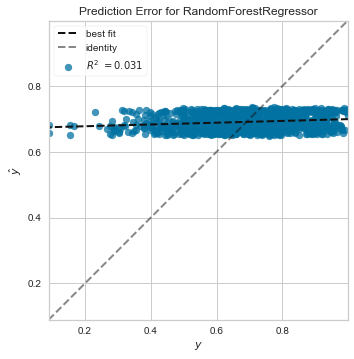

<AxesSubplot:title={'center':'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [60]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser2=PredictionError(RFf)
visualiser2.fit(X_trainf,y_train)
visualiser2.score(X_testf,y_test)
visualiser2.poof()

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


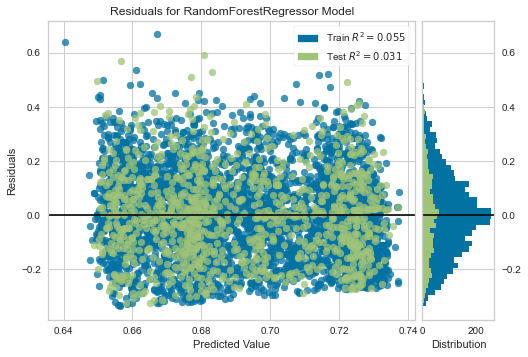

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [61]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer2=ResidualsPlot(RFf)
visualizer2.fit(X_trainf,y_train)
visualizer2.score(X_testf,y_test)
visualizer2.poof()

### SEMI SUPERVISED MACHINE LEARNING

In [62]:
datam=music.sample(frac=0.05, random_state=0)
print(datam.head)
datam.shape

<bound method NDFrame.head of         chroma_cens_kurtosis_01  chroma_cens_kurtosis_02  \
80954                  0.193511                 0.281533   
97841                 -0.345391                 0.534547   
93719                 -0.259741                -0.550599   
103653                -0.148740                -0.965083   
46028                  0.171561                 0.025517   
...                         ...                      ...   
6903                   1.484898                 2.254299   
63893                 -0.525403                -0.251578   
93518                 -0.408156                -0.309331   
81330                  0.602447                -0.099120   
86997                 -1.097779                -0.863964   

        chroma_cens_kurtosis_03  chroma_cens_kurtosis_04  \
80954                 -0.517525                -0.587515   
97841                 -0.156564                -0.707366   
93719                 -0.299593                 0.342165   
103653   

(5329, 520)

In [63]:
datas=datam.drop('track_listens', axis=1)

In [64]:
datas['album_date_released'] = pd.to_datetime(datas.album_date_released)
datas['Year'] = datas.album_date_released.dt.year
datas.head()

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01,album_date_released,Year
80954,0.193511,0.281533,-0.517525,-0.587515,-0.447197,-0.288004,-0.488477,-1.139392,-1.298042,-1.053714,...,0.027630,2.060820,0.147461,0.035186,0.034180,0.000000,0.599059,0.015552,2015-05-29,2015.0
97841,-0.345391,0.534547,-0.156564,-0.707366,0.613957,0.176181,-0.221675,0.059568,-0.694602,-0.038627,...,0.020687,0.605567,0.220703,0.059020,0.047363,0.000000,1.024775,0.041243,NaT,NaN
93719,-0.259741,-0.550599,-0.299593,0.342165,0.245572,1.019197,1.690720,-0.501243,-0.613597,0.092761,...,0.026802,57.648003,0.676270,0.029575,0.015625,0.000488,6.060658,0.047432,2016-05-18,2016.0
103653,-0.148740,-0.965083,-0.873013,-0.297252,1.116310,5.176410,4.447114,0.118036,1.975099,0.825332,...,0.021152,54.571293,0.244141,0.014288,0.011719,0.002441,6.911194,0.017009,2017-02-02,2017.0
46028,0.171561,0.025517,-0.180407,-0.191088,0.265154,0.167380,3.315781,0.969577,0.730078,0.108710,...,0.020532,1.997491,0.475586,0.094146,0.058594,0.000000,1.502114,0.087465,NaT,NaN


In [65]:
datas.dtypes
df=datas.drop('album_date_released', axis=1)
df.shape
df

,chroma_cens_kurtosis_01,chroma_cens_kurtosis_02,chroma_cens_kurtosis_03,chroma_cens_kurtosis_04,chroma_cens_kurtosis_05,chroma_cens_kurtosis_06,chroma_cens_kurtosis_07,chroma_cens_kurtosis_08,chroma_cens_kurtosis_09,chroma_cens_kurtosis_10,...,tonnetz_std_05,tonnetz_std_06,zcr_kurtosis_01,zcr_max_01,zcr_mean_01,zcr_median_01,zcr_min_01,zcr_skew_01,zcr_std_01,Year
80954,0.193511,0.281533,-0.517525,-0.587515,-0.447197,-0.288004,-0.488477,-1.139392,-1.298042,-1.053714,...,0.026520,0.027630,2.060820,0.147461,0.035186,0.034180,0.000000,0.599059,0.015552,2015.0
97841,-0.345391,0.534547,-0.156564,-0.707366,0.613957,0.176181,-0.221675,0.059568,-0.694602,-0.038627,...,0.024474,0.020687,0.605567,0.220703,0.059020,0.047363,0.000000,1.024775,0.041243,NaN
93719,-0.259741,-0.550599,-0.299593,0.342165,0.245572,1.019197,1.690720,-0.501243,-0.613597,0.092761,...,0.024392,0.026802,57.648003,0.676270,0.029575,0.015625,0.000488,6.060658,0.047432,2016.0
103653,-0.148740,-0.965083,-0.873013,-0.297252,1.116310,5.176410,4.447114,0.118036,1.975099,0.825332,...,0.032700,0.021152,54.571293,0.244141,0.014288,0.011719,0.002441,6.911194,0.017009,2017.0
46028,0.171561,0.025517,-0.180407,-0.191088,0.265154,0.167380,3.315781,0.969577,0.730078,0.108710,...,0.017475,0.020532,1.997491,0.475586,0.094146,0.058594,0.000000,1.502114,0.087465,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6903,1.484898,2.254299,3.423062,2.774919,2.570776,2.527680,2.648293,7.202261,2.200285,-0.298708,...,0.015582,0.013092,3.423906,0.265625,0.051869,0.048828,0.000000,0.980733,0.023690,2009.0
63893,-0.525403,-0.251578,-0.168578,0.323087,-0.621951,0.017029,-0.327830,-0.963387,-0.765053,-0.282275,...,0.019573,0.021340,4.840606,0.305176,0.066812,0.063477,0.003906,1.355228,0.034984,2013.0
93518,-0.408156,-0.309331,-0.434191,-0.304612,0.775287,0.056287,-0.441614,-0.307985,-0.233521,-0.876141,...,0.018339,0.016705,9.612201,0.469238,0.078130,0.072754,0.000000,1.786609,0.034111,2015.0
81330,0.602447,-0.099120,-0.548983,-0.746334,-0.297986,-0.662524,0.343717,-0.993108,-0.728296,-0.893882,...,0.015827,0.015740,4.521516,0.338379,0.039353,0.023926,0.001465,1.946049,0.039186,2015.0


In [66]:
## renaming the features
for c in df.columns:
    #data[c].rename(columns = lambda x : 'v_' + x)
    cols = df.columns.tolist()
    df.columns = cols[:0] + ['v_%i' % i for i in range(1, len(cols[0:])+1)]
    
    print(df.columns)

Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...

Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...

      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516', 'v_517',
       'v_518', 'v_519'],
      dtype='object', length=519)
Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7'

In [67]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from numpy import concatenate

#splitting the dataset in to test and train data
test_data=df[df['v_519'].isnull()]
test_data
df.dropna(inplace=True)
df.shape

(3477, 519)

In [98]:
# df is the train data so we create x and y train data from it
x_train = df.drop('v_519',axis=1)
y_train = df['v_519']

In [99]:
from sklearn.ensemble import RandomForestRegressor
RF=RandomForestRegressor(n_estimators=100,random_state=0).fit(x_train, y_train)
RF.score(x_train,y_train)

0.8636577317605868

In [100]:
## create x test from test data
x_test = test_data.iloc[:,:-1]
x_test
y_pred=RF.predict(x_test)
#test_data['y_pred'] = y_pred
test_data.loc[:,'v_519'] = y_pred
test_data

C:\Users\Dell\anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
97841,-0.345391,0.534547,-0.156564,-0.707366,0.613957,0.176181,-0.221675,0.059568,-0.694602,-0.038627,...,0.024474,0.020687,0.605567,0.220703,0.059020,0.047363,0.000000,1.024775,0.041243,2010.79
46028,0.171561,0.025517,-0.180407,-0.191088,0.265154,0.167380,3.315781,0.969577,0.730078,0.108710,...,0.017475,0.020532,1.997491,0.475586,0.094146,0.058594,0.000000,1.502114,0.087465,2008.55
1531,0.452109,-0.834028,-0.581804,-0.074117,-0.378644,-0.472600,-0.826434,-0.735898,-0.522516,-0.374305,...,0.023726,0.017760,43.169136,0.723633,0.061920,0.043457,0.002930,6.131421,0.083442,2010.15
99121,0.171316,-0.088138,1.045061,1.556388,1.064216,1.262783,0.151072,1.640472,1.702385,2.372707,...,0.015767,0.017575,3.448006,0.293945,0.084448,0.086426,0.010742,0.905595,0.033744,2011.27
14961,-0.044371,-0.816634,-0.293097,0.596385,-0.243717,-0.788154,-0.144834,0.562969,0.267802,1.347371,...,0.017620,0.018915,20.226921,0.288574,0.028303,0.017090,0.000000,4.066301,0.035744,2010.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40814,0.174224,-0.578730,-0.594539,-0.910224,-0.929747,-0.980893,2.178141,2.385567,-0.898135,0.042556,...,0.017840,0.021583,0.005239,0.100586,0.036450,0.035645,0.003906,0.407045,0.013056,2010.59
11046,-0.856808,0.090062,0.994725,1.349626,-1.177833,-1.263348,0.151252,-1.104614,-0.776860,-0.256952,...,0.024928,0.024050,1.767337,0.282715,0.047657,0.038086,0.000000,1.214458,0.038674,2010.99
55728,0.707107,-0.331632,0.185387,0.107390,0.440895,0.510953,-0.055311,-0.094767,-0.115789,-0.370251,...,0.017146,0.017011,2.474725,0.476562,0.070976,0.044434,0.000000,1.711286,0.065929,2009.25
20343,-0.967740,-1.127880,-1.255576,-0.868696,-1.171987,-0.031338,0.183748,-0.390546,-0.212449,-0.723193,...,0.026767,0.021613,17.707041,0.363281,0.036115,0.025879,0.000000,3.809325,0.039072,2010.69


In [101]:
## data augmentation
dataf = pd.concat([df,test_data])
dataf['v_519']=dataf['v_519'].round(0)
dataf

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
80954,0.193511,0.281533,-0.517525,-0.587515,-0.447197,-0.288004,-0.488477,-1.139392,-1.298042,-1.053714,...,0.026520,0.027630,2.060820,0.147461,0.035186,0.034180,0.000000,0.599059,0.015552,2015.0
93719,-0.259741,-0.550599,-0.299593,0.342165,0.245572,1.019197,1.690720,-0.501243,-0.613597,0.092761,...,0.024392,0.026802,57.648003,0.676270,0.029575,0.015625,0.000488,6.060658,0.047432,2016.0
103653,-0.148740,-0.965083,-0.873013,-0.297252,1.116310,5.176410,4.447114,0.118036,1.975099,0.825332,...,0.032700,0.021152,54.571293,0.244141,0.014288,0.011719,0.002441,6.911194,0.017009,2017.0
62263,-0.839433,-1.398624,-1.129336,-0.730848,-1.259985,-1.154711,-0.473286,-0.724502,-0.811358,-1.095075,...,0.033975,0.034560,95.726982,0.377930,0.022461,0.018066,0.004395,9.530399,0.031458,2009.0
37309,-1.042265,-1.027894,-0.466941,0.138460,0.626001,1.398253,-1.102737,-1.041862,-0.943576,-0.220532,...,0.019500,0.021113,14.285413,0.433594,0.055196,0.038574,0.001953,3.370455,0.064735,2011.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40814,0.174224,-0.578730,-0.594539,-0.910224,-0.929747,-0.980893,2.178141,2.385567,-0.898135,0.042556,...,0.017840,0.021583,0.005239,0.100586,0.036450,0.035645,0.003906,0.407045,0.013056,2011.0
11046,-0.856808,0.090062,0.994725,1.349626,-1.177833,-1.263348,0.151252,-1.104614,-0.776860,-0.256952,...,0.024928,0.024050,1.767337,0.282715,0.047657,0.038086,0.000000,1.214458,0.038674,2011.0
55728,0.707107,-0.331632,0.185387,0.107390,0.440895,0.510953,-0.055311,-0.094767,-0.115789,-0.370251,...,0.017146,0.017011,2.474725,0.476562,0.070976,0.044434,0.000000,1.711286,0.065929,2009.0
20343,-0.967740,-1.127880,-1.255576,-0.868696,-1.171987,-0.031338,0.183748,-0.390546,-0.212449,-0.723193,...,0.026767,0.021613,17.707041,0.363281,0.036115,0.025879,0.000000,3.809325,0.039072,2011.0


In [102]:
## checking for missing values
dataf.isnull().sum().sort_values(ascending=False)

v_1      0
v_326    0
v_356    0
v_355    0
v_354    0
        ..
v_169    0
v_168    0
v_167    0
v_166    0
v_519    0
Length: 519, dtype: int64

In [103]:
### checking for duplicated data
dataf.duplicated().sort_values(ascending=False)

4540      True
78707     True
44552     True
95788    False
77154    False
         ...  
52928    False
22418    False
65110    False
76876    False
86997    False
Length: 5329, dtype: bool

In [104]:
dataf.drop_duplicates()

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
80954,0.193511,0.281533,-0.517525,-0.587515,-0.447197,-0.288004,-0.488477,-1.139392,-1.298042,-1.053714,...,0.026520,0.027630,2.060820,0.147461,0.035186,0.034180,0.000000,0.599059,0.015552,2015.0
93719,-0.259741,-0.550599,-0.299593,0.342165,0.245572,1.019197,1.690720,-0.501243,-0.613597,0.092761,...,0.024392,0.026802,57.648003,0.676270,0.029575,0.015625,0.000488,6.060658,0.047432,2016.0
103653,-0.148740,-0.965083,-0.873013,-0.297252,1.116310,5.176410,4.447114,0.118036,1.975099,0.825332,...,0.032700,0.021152,54.571293,0.244141,0.014288,0.011719,0.002441,6.911194,0.017009,2017.0
62263,-0.839433,-1.398624,-1.129336,-0.730848,-1.259985,-1.154711,-0.473286,-0.724502,-0.811358,-1.095075,...,0.033975,0.034560,95.726982,0.377930,0.022461,0.018066,0.004395,9.530399,0.031458,2009.0
37309,-1.042265,-1.027894,-0.466941,0.138460,0.626001,1.398253,-1.102737,-1.041862,-0.943576,-0.220532,...,0.019500,0.021113,14.285413,0.433594,0.055196,0.038574,0.001953,3.370455,0.064735,2011.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40814,0.174224,-0.578730,-0.594539,-0.910224,-0.929747,-0.980893,2.178141,2.385567,-0.898135,0.042556,...,0.017840,0.021583,0.005239,0.100586,0.036450,0.035645,0.003906,0.407045,0.013056,2011.0
11046,-0.856808,0.090062,0.994725,1.349626,-1.177833,-1.263348,0.151252,-1.104614,-0.776860,-0.256952,...,0.024928,0.024050,1.767337,0.282715,0.047657,0.038086,0.000000,1.214458,0.038674,2011.0
55728,0.707107,-0.331632,0.185387,0.107390,0.440895,0.510953,-0.055311,-0.094767,-0.115789,-0.370251,...,0.017146,0.017011,2.474725,0.476562,0.070976,0.044434,0.000000,1.711286,0.065929,2009.0
20343,-0.967740,-1.127880,-1.255576,-0.868696,-1.171987,-0.031338,0.183748,-0.390546,-0.212449,-0.723193,...,0.026767,0.021613,17.707041,0.363281,0.036115,0.025879,0.000000,3.809325,0.039072,2011.0


In [105]:
##summary statistics##
dataf.describe()

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518,v_519
count,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,...,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000
mean,0.173648,0.140640,0.416868,0.193511,0.254946,0.333542,0.587347,0.953107,0.273854,0.315697,...,0.021545,0.021807,29.886416,0.378444,0.052279,0.043256,0.002347,3.243812,0.040036,2010.612122
std,1.810900,3.460466,9.223288,3.939673,4.712096,7.142986,32.832958,53.035179,7.982694,5.020021,...,0.006124,0.006153,83.081058,0.182686,0.033187,0.033079,0.006022,3.015656,0.027362,3.976311
min,-1.859782,-1.856905,-1.869149,-1.806917,-1.811909,-1.902058,-1.829760,-1.836731,-1.795678,-1.873126,...,0.005901,0.004520,-1.677419,0.023926,0.001866,0.000000,0.000000,-4.785390,0.001067,1913.000000
25%,-0.631635,-0.654344,-0.633937,-0.637246,-0.663171,-0.617407,-0.639705,-0.617661,-0.657192,-0.649086,...,0.017232,0.017482,3.442542,0.243652,0.032452,0.024902,0.000000,1.420723,0.021478,2009.000000
50%,-0.170039,-0.205678,-0.160234,-0.186295,-0.200087,-0.152537,-0.184457,-0.133287,-0.189433,-0.166137,...,0.020627,0.020840,9.850470,0.355957,0.046715,0.037109,0.000000,2.428612,0.033252,2011.000000
75%,0.477568,0.440341,0.557714,0.445846,0.479802,0.536244,0.486349,0.578016,0.474265,0.529622,...,0.025086,0.025116,27.684193,0.467773,0.063805,0.053711,0.003418,4.170532,0.050871,2013.000000
max,41.982716,217.670364,525.912537,231.880295,259.442993,447.825378,2394.002686,3869.482178,443.855347,219.587036,...,0.073108,0.086993,2247.413330,0.999512,0.658522,0.769531,0.216309,38.633812,0.344076,2017.000000


In [106]:
## checking skewness
datar=dataf.drop('v_519', axis=1)
skf=datar.skew()
skf=skf[abs(skf)>0.5].index
skf

Index(['v_1', 'v_2', 'v_3', 'v_4', 'v_5', 'v_6', 'v_7', 'v_8', 'v_9', 'v_10',
       ...
       'v_509', 'v_510', 'v_511', 'v_512', 'v_513', 'v_514', 'v_515', 'v_516',
       'v_517', 'v_518'],
      dtype='object', length=322)

In [107]:
datar[skf]=np.log1p(abs(datar[skf]))
datar

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_509,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518
80954,0.176899,0.248057,0.417081,0.462170,0.369629,0.253094,0.397753,0.760522,0.832058,0.719650,...,0.158044,0.026175,0.027255,1.118683,0.137552,0.034581,0.033609,0.000000,0.469415,0.015432
93719,0.230906,0.438642,0.262051,0.294284,0.219595,0.702700,0.989809,0.406294,0.478466,0.088708,...,0.075806,0.024099,0.026449,4.071554,0.516571,0.029146,0.015504,0.000488,1.954538,0.046341
103653,0.138666,0.675534,0.627549,0.260249,0.749674,1.820737,1.695086,0.111573,1.090277,0.601762,...,0.130151,0.032176,0.020932,4.017667,0.218445,0.014187,0.011651,0.002438,2.068279,0.016866
62263,0.609457,0.874895,0.755810,0.548611,0.815358,0.767657,0.387496,0.544938,0.594077,0.739589,...,0.155203,0.033410,0.033977,4.571892,0.320582,0.022213,0.017905,0.004385,2.354266,0.030973
37309,0.714059,0.706998,0.383179,0.129677,0.486123,0.874741,0.743240,0.713862,0.664530,0.199287,...,0.070554,0.019312,0.020893,2.726899,0.360184,0.053726,0.037849,0.001951,1.474867,0.062726
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40814,0.160608,0.456621,0.466585,0.647220,0.657389,0.683548,1.156296,1.219521,0.640872,0.041675,...,0.084397,0.017683,0.021354,0.005225,0.095843,0.035802,0.035024,0.003899,0.341491,0.012972
11046,0.618859,0.086235,0.690506,0.854256,0.778330,0.816845,0.140850,0.744132,0.574848,0.228689,...,0.081066,0.024622,0.023765,1.017886,0.248979,0.046556,0.037379,0.000000,0.795008,0.037945
55728,0.534800,0.286405,0.170070,0.102006,0.365264,0.412740,0.053836,0.090541,0.109562,0.314994,...,0.084559,0.017000,0.016868,1.245515,0.389717,0.068571,0.043475,0.000000,0.997423,0.063847
20343,0.676886,0.755126,0.813405,0.625241,0.775642,0.030857,0.168685,0.329696,0.192643,0.544179,...,0.145495,0.026415,0.021382,2.928900,0.309894,0.035478,0.025550,0.000000,1.570557,0.038328


In [108]:
#### data values found out of the range is label true and consider an outlier therefore has to be remove
#for column in data1:
Q1 = datar.quantile(0.25)
Q3 = datar.quantile(0.75)
IQR = Q3 - Q1
#print(IQR)
print((datar< (Q1 - 1.5 * IQR)) | (datar> (Q3 + 1.5 * IQR)))

          v_1    v_2    v_3    v_4    v_5    v_6    v_7    v_8    v_9   v_10  \
80954   False  False  False  False  False  False  False  False  False  False   
93719   False  False  False  False  False  False  False  False  False  False   
103653  False  False  False  False  False   True   True  False  False  False   
62263   False  False  False  False  False  False  False  False  False  False   
37309   False  False  False  False  False  False  False  False  False  False   
...       ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
40814   False  False  False  False  False  False  False  False  False  False   
11046   False  False  False  False  False  False  False  False  False  False   
55728   False  False  False  False  False  False  False  False  False  False   
20343   False  False  False  False  False  False  False  False  False  False   
86997   False  False  False  False  False  False  False  False  False  False   

        ...  v_509  v_510  v_511  v_512

In [109]:
#data2 = data1[~((data1 < (Q1 - 1.5 * IQR)) |(data1> (Q3 + 1.5 * IQR))).any(axis=1)]
#print(data2.shape)
#data2

In [110]:
## outlier treatment with median
for column in datar:
    m1=datar[column].quantile(0.50) 
    p1=datar[column].quantile(0.95)
    datar[column] = np.where(datar[column] > p1, m1, datar[column])
datar.describe()

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_509,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518
count,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,...,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000,5329.000000
mean,0.454999,0.451533,0.467741,0.446253,0.465136,0.460887,0.455189,0.466083,0.459993,0.468777,...,0.088914,0.020504,0.020739,2.307441,0.297588,0.045923,0.037447,0.001506,1.206915,0.034884
std,0.266466,0.254644,0.266472,0.252166,0.260000,0.263970,0.255298,0.270247,0.260127,0.270219,...,0.027778,0.004748,0.004729,1.150377,0.109518,0.018867,0.017219,0.002197,0.493298,0.017876
min,0.000312,0.000105,0.000084,0.000001,0.000073,0.000085,0.000125,0.000084,0.000113,0.000022,...,0.016109,0.005884,0.004510,0.001836,0.023644,0.001864,0.000000,0.000000,0.004402,0.001066
25%,0.244885,0.253544,0.262264,0.247335,0.266092,0.258659,0.253969,0.257874,0.258210,0.259167,...,0.068785,0.017085,0.017331,1.491227,0.218052,0.031936,0.024597,0.000000,0.885243,0.021251
50%,0.456652,0.455949,0.475283,0.450055,0.475009,0.463852,0.463390,0.472201,0.469302,0.478390,...,0.088930,0.020418,0.020626,2.384208,0.304508,0.045657,0.036437,0.000000,1.233824,0.032711
75%,0.635137,0.629666,0.640856,0.619564,0.639341,0.641588,0.630158,0.642576,0.635492,0.644663,...,0.108061,0.023663,0.023815,3.122719,0.366296,0.058138,0.048604,0.002438,1.530977,0.045513
max,1.211350,1.158079,1.252808,1.160902,1.208899,1.203313,1.185959,1.261727,1.177667,1.234897,...,0.155203,0.031955,0.032801,4.758972,0.566844,0.098407,0.085138,0.009235,2.301530,0.085908


In [111]:
### normilisation of data
from sklearn import preprocessing
x = datar.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
datar3 = pd.DataFrame(x_scaled, columns=datar.columns)
datar3

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_509,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518
0,0.145815,0.214126,0.332872,0.398112,0.305715,0.210275,0.335315,0.602736,0.706503,0.582754,...,0.523540,0.778300,0.803975,0.234773,0.209697,0.338887,0.394754,0.000000,0.202432,0.169332
1,0.190410,0.378710,0.209118,0.253495,0.181599,0.583942,0.834589,0.321969,0.406226,0.071818,...,0.429190,0.698692,0.775484,0.855497,0.907450,0.282593,0.182107,0.052862,0.848945,0.533640
2,0.114244,0.583285,0.500880,0.224177,0.620107,0.385436,0.390666,0.088368,0.925787,0.487288,...,0.819890,0.557473,0.580467,0.844170,0.358617,0.127640,0.136844,0.264055,0.898459,0.186232
3,0.502994,0.755449,0.603267,0.472573,0.674444,0.637927,0.326665,0.431861,0.504405,0.598901,...,1.000000,0.557473,0.569661,0.960674,0.546646,0.210771,0.210308,0.474836,0.535199,0.352504
4,0.589368,0.610457,0.305810,0.111703,0.402085,0.726925,0.626660,0.565753,0.564235,0.161364,...,0.391424,0.515059,0.579116,0.572837,0.619551,0.537192,0.444559,0.211295,0.640132,0.726757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5324,0.132362,0.394237,0.372389,0.557515,0.543764,0.568025,0.974986,0.966547,0.544144,0.033731,...,0.490948,0.452583,0.595392,0.000712,0.132914,0.351527,0.411379,0.422179,0.146744,0.140326
5325,0.510758,0.074380,0.551137,0.735855,0.643812,0.678808,0.118672,0.589745,0.488076,0.185175,...,0.466999,0.718750,0.680624,0.213584,0.414828,0.462922,0.439036,0.000000,0.344171,0.434675
5326,0.441347,0.247242,0.135693,0.087867,0.302104,0.342957,0.045294,0.071698,0.092946,0.255064,...,0.492117,0.426401,0.436838,0.261434,0.673919,0.690951,0.510639,0.000000,0.432288,0.739974
5327,0.558673,0.652019,0.649242,0.538582,0.641589,0.025575,0.142145,0.261256,0.163500,0.440658,...,0.930206,0.787517,0.596406,0.615300,0.526971,0.348174,0.300098,0.000000,0.681788,0.439192


### Data partioning and supervised machine learning

The 10 fold cross validation is to avoid over fitting of the model that is we want more accurate estimate of sample data. In summary to evaluate the performance of our model

In [112]:
### importing library
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn import model_selection
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

In [113]:
##Data partioning
X = datar3
y = dataf['v_519']
##splitting the data in to test and train
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X, y, test_size=0.2, random_state=0)
##building the model
print(X_train_s.shape, X_test_s.shape, y_train_s.shape, y_test_s.shape)

(4263, 518) (1066, 518) (4263,) (1066,)


In [84]:
# prepare models
models = []
models.append(('LR', LinearRegression()))
models.append(('PLS', PLSRegression()))
models.append(('RR', Ridge()))
models.append(('LS', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('RF', RandomForestRegressor()))

In [85]:
results = []
names = []
scoring = 'neg_mean_squared_error'
for name, model in models:
    kfold = model_selection.KFold(n_splits=10, random_state=None)
    mse_cv = model_selection.cross_val_score(model,X_train_s,y_train_s, cv=kfold, scoring=scoring)
    results.append(mse_cv)
    names.append(name)
    msg = "%s: %.3f,%.3f,%.3f" % (name, mse_cv.mean(),mse_cv.var(), mse_cv.std())
    print(msg)

LR: -16.577,57.189,7.562
PLS: -14.766,65.646,8.102
RR: -16.105,57.829,7.605
LS: -15.652,70.721,8.410
EN: -15.652,70.721,8.410
RF: -15.592,64.543,8.034


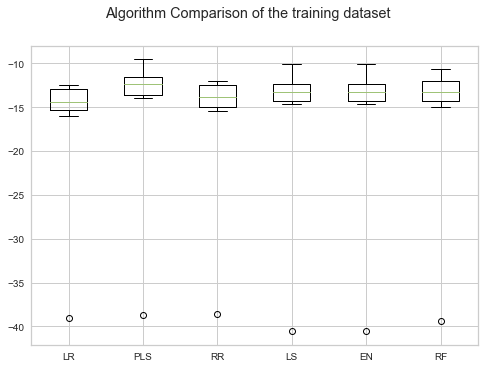

In [86]:
###plotting the algorithm compariso in a box plot
fig = plt.figure(edgecolor='green')
fig.suptitle('Algorithm Comparison of the training dataset')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

### Dimensionality Reduction

-It eliminates noise and redundant features.
-It helps improve the model’s accuracy and performance. 
-It facilitates the usage of algorithms that are unfit for more substantial dimensions. 
-It reduces the amount of storage space required (less data needs lesser storage space).
-It compresses the data, which reduces the computation time and facilitates faster training of the data.

In [114]:
##Feature selection: Pearson Correlation
### using the train and test model above
X_train_s.corr()

,v_1,v_2,v_3,v_4,v_5,v_6,v_7,v_8,v_9,v_10,...,v_509,v_510,v_511,v_512,v_513,v_514,v_515,v_516,v_517,v_518
v_1,1.000000,0.220878,0.130202,0.104819,0.119613,0.120862,0.060172,0.121157,0.077394,0.101628,...,0.052651,0.053261,0.049370,0.000805,-0.057632,-0.059158,-0.049682,0.030912,0.000323,-0.062761
v_2,0.220878,1.000000,0.224817,0.169375,0.119365,0.118984,0.131846,0.106757,0.145524,0.104518,...,0.051744,0.041361,0.042621,0.006684,-0.044899,-0.061483,-0.060515,0.003690,0.004125,-0.037500
v_3,0.130202,0.224817,1.000000,0.232836,0.133220,0.129019,0.107909,0.097588,0.094481,0.104202,...,0.040225,0.025997,0.035824,0.010102,-0.036520,-0.084249,-0.072568,-0.017628,0.009475,-0.056901
v_4,0.104819,0.169375,0.232836,1.000000,0.223431,0.158557,0.095136,0.105594,0.144604,0.088280,...,0.059477,0.033368,0.068318,0.021548,-0.030578,-0.077083,-0.059251,-0.019904,0.022227,-0.062297
v_5,0.119613,0.119365,0.133220,0.223431,1.000000,0.269327,0.147730,0.099954,0.123554,0.138298,...,0.054368,0.036237,0.064931,0.008984,-0.008998,-0.050947,-0.039461,0.009052,0.009452,-0.027824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
v_514,-0.059158,-0.061483,-0.084249,-0.077083,-0.050947,-0.034368,-0.066889,-0.046773,-0.053465,-0.057275,...,-0.214403,-0.312094,-0.295396,-0.350499,0.292508,1.000000,0.858504,0.047211,-0.311418,0.543376
v_515,-0.049682,-0.060515,-0.072568,-0.059251,-0.039461,-0.028825,-0.066103,-0.048677,-0.053081,-0.050948,...,-0.200114,-0.312154,-0.302652,-0.362533,0.135632,0.858504,1.000000,0.083534,-0.385911,0.294946
v_516,0.030912,0.003690,-0.017628,-0.019904,0.009052,-0.006246,-0.053661,-0.004634,-0.020425,-0.011988,...,0.058960,-0.012032,-0.000092,0.056369,0.008668,0.047211,0.083534,1.000000,0.045461,-0.021048
v_517,0.000323,0.004125,0.009475,0.022227,0.009452,-0.023383,0.022736,0.000822,-0.016132,-0.009191,...,0.184733,0.221409,0.201464,0.905894,0.422838,-0.311418,-0.385911,0.045461,1.000000,0.107725


In [115]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [116]:
corr_features = correlation(X_train_s, 0.7)
len(set(corr_features))

165

In [117]:
## dropping correlated futures out from the test and train
X_trainps=X_train_s.drop(corr_features,axis=1)
X_testps=X_test_s.drop(corr_features,axis=1)

In [118]:
### usinf our baseline model RF
RF=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_trainps,y_train_s)

In [119]:
## evaluating training model
RF.score(X_trainps,y_train_s)
ytrps_pred=RF.predict(X_trainps)
yteps_pred=RF.predict(X_testps)

In [120]:
###evaluating on train
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train_s, ytrps_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train_s, ytrps_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train_s, ytrps_pred)))
print('R-2:', metrics.r2_score(y_train_s, ytrps_pred))

Mean Absolute Error: 2.3606025518556453
Mean Square Error: 13.808986959064251
Root Mean Square Error: 3.7160445313618418
R-2: 0.15823100944007296


In [121]:
## evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_s, yteps_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test_s, yteps_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test_s, yteps_pred)))
print('R-2:', metrics.r2_score(y_test_s, yteps_pred))

Mean Absolute Error: 2.3408093405128407
Mean Square Error: 13.05327661974658
Root Mean Square Error: 3.6129318592725466
R-2: 0.027406956304446783


In [122]:
#pip install yellowbrick

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


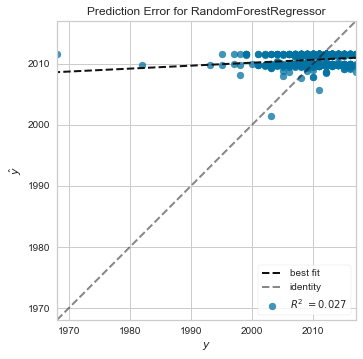

<AxesSubplot:title={'center':'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [123]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser=PredictionError(RF)
visualiser.fit(X_trainps,y_train_s)
visualiser.score(X_testps,y_test_s)
visualiser.poof()

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


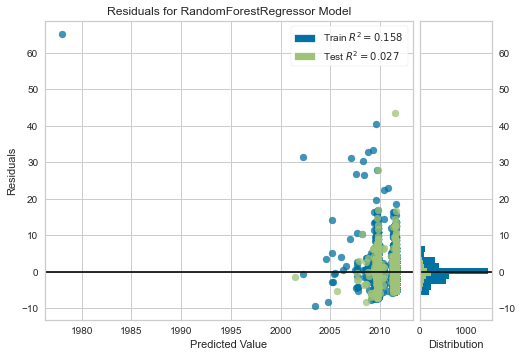

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [124]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer1=ResidualsPlot(RF)
visualizer1.fit(X_trainps,y_train_s)
visualizer1.score(X_testps,y_test_s)
visualizer1.poof()

In [125]:
##Feature selection: LASSO
### using the train and test model above
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

In [126]:
pipeline=Pipeline([('scaler', StandardScaler()), ('model',Lasso())])

In [127]:
search=GridSearchCV(pipeline,
                    {'model__alpha':np.arange(0.1,10,0.1)}, 
                    cv=10, 
                    scoring='neg_mean_squared_error', 
                    verbose=3
                   )

In [128]:
search.fit(X_train_s, y_train_s)

Fitting 10 folds for each of 99 candidates, totalling 990 fits
[CV 1/10] END ...............model__alpha=0.1;, score=-38.646 total time=   0.1s
[CV 2/10] END ...............model__alpha=0.1;, score=-13.272 total time=   0.2s
[CV 3/10] END ...............model__alpha=0.1;, score=-12.011 total time=   0.1s
[CV 4/10] END ...............model__alpha=0.1;, score=-13.184 total time=   0.1s
[CV 5/10] END ................model__alpha=0.1;, score=-9.529 total time=   0.2s
[CV 6/10] END ...............model__alpha=0.1;, score=-11.475 total time=   0.2s
[CV 7/10] END ...............model__alpha=0.1;, score=-14.102 total time=   0.1s
[CV 8/10] END ...............model__alpha=0.1;, score=-13.199 total time=   0.1s
[CV 9/10] END ...............model__alpha=0.1;, score=-14.280 total time=   0.0s
[CV 10/10] END ..............model__alpha=0.1;, score=-11.244 total time=   0.1s
[CV 1/10] END ...............model__alpha=0.2;, score=-39.248 total time=   0.1s
[CV 2/10] END ...............model__alpha=0.2;

[CV 3/10] END ...............model__alpha=1.1;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=1.1;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=1.1;, score=-10.465 total time=   0.1s
[CV 6/10] END ...............model__alpha=1.1;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=1.1;, score=-15.246 total time=   0.1s
[CV 8/10] END ...............model__alpha=1.1;, score=-14.716 total time=   0.1s
[CV 9/10] END ...............model__alpha=1.1;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=1.1;, score=-12.464 total time=   0.0s
[CV 1/10] END model__alpha=1.2000000000000002;, score=-40.772 total time=   0.0s
[CV 2/10] END model__alpha=1.2000000000000002;, score=-14.871 total time=   0.0s
[CV 3/10] END model__alpha=1.2000000000000002;, score=-12.949 total time=   0.0s
[CV 4/10] END model__alpha=1.2000000000000002;, score=-14.304 total time=   0.0s
[CV 5/10] END model__alpha=1

[CV 5/10] END ...............model__alpha=2.1;, score=-10.465 total time=   0.1s
[CV 6/10] END ...............model__alpha=2.1;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=2.1;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=2.1;, score=-14.716 total time=   0.1s
[CV 9/10] END ...............model__alpha=2.1;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=2.1;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=2.2;, score=-40.772 total time=   0.1s
[CV 2/10] END ...............model__alpha=2.2;, score=-14.871 total time=   0.1s
[CV 3/10] END ...............model__alpha=2.2;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=2.2;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=2.2;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=2.2;, score=-13.280 total time=   0.0s
[CV 7/10] END ..............

[CV 8/10] END ...............model__alpha=3.1;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=3.1;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=3.1;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=3.2;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=3.2;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=3.2;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=3.2;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=3.2;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=3.2;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=3.2;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=3.2;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=3.2;, score=-15.074 total time=   0.0s
[CV 10/10] END .............

[CV 1/10] END ...............model__alpha=4.2;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=4.2;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=4.2;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=4.2;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=4.2;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=4.2;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=4.2;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=4.2;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=4.2;, score=-15.074 total time=   0.1s
[CV 10/10] END ..............model__alpha=4.2;, score=-12.464 total time=   0.1s
[CV 1/10] END ...............model__alpha=4.3;, score=-40.772 total time=   0.1s
[CV 2/10] END ...............model__alpha=4.3;, score=-14.871 total time=   0.1s
[CV 3/10] END ..............

[CV 4/10] END ...............model__alpha=5.2;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=5.2;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=5.2;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=5.2;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=5.2;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=5.2;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=5.2;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=5.3;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=5.3;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=5.3;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=5.3;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=5.3;, score=-10.465 total time=   0.0s
[CV 6/10] END ..............

[CV 7/10] END ...............model__alpha=6.2;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=6.2;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=6.2;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=6.2;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=6.3;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=6.3;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=6.3;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=6.3;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=6.3;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=6.3;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=6.3;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=6.3;, score=-14.716 total time=   0.0s
[CV 9/10] END ..............

[CV 9/10] END ...............model__alpha=7.2;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=7.2;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=7.3;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=7.3;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=7.3;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=7.3;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=7.3;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=7.3;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=7.3;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=7.3;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=7.3;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=7.3;, score=-12.464 total time=   0.0s
[CV 1/10] END ..............

[CV 1/10] END ...............model__alpha=8.3;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=8.3;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=8.3;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=8.3;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=8.3;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=8.3;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=8.3;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=8.3;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=8.3;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=8.3;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=8.4;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=8.4;, score=-14.871 total time=   0.0s
[CV 3/10] END ..............

[CV 4/10] END ...............model__alpha=9.3;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=9.3;, score=-10.465 total time=   0.0s
[CV 6/10] END ...............model__alpha=9.3;, score=-13.280 total time=   0.0s
[CV 7/10] END ...............model__alpha=9.3;, score=-15.246 total time=   0.0s
[CV 8/10] END ...............model__alpha=9.3;, score=-14.716 total time=   0.0s
[CV 9/10] END ...............model__alpha=9.3;, score=-15.074 total time=   0.0s
[CV 10/10] END ..............model__alpha=9.3;, score=-12.464 total time=   0.0s
[CV 1/10] END ...............model__alpha=9.4;, score=-40.772 total time=   0.0s
[CV 2/10] END ...............model__alpha=9.4;, score=-14.871 total time=   0.0s
[CV 3/10] END ...............model__alpha=9.4;, score=-12.949 total time=   0.0s
[CV 4/10] END ...............model__alpha=9.4;, score=-14.304 total time=   0.0s
[CV 5/10] END ...............model__alpha=9.4;, score=-10.465 total time=   0.0s
[CV 6/10] END ..............

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', Lasso())]),
             param_grid={'model__alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6,
       2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9,
       4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2,
       5.3, 5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5,
       6.6, 6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8,
       7.9, 8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. , 9.1,
       9.2, 9.3, 9.4, 9.5, 9.6, 9.7, 9.8, 9.9])},
             scoring='neg_mean_squared_error', verbose=3)

In [129]:
search.best_params_

{'model__alpha': 0.1}

In [130]:
lasso=Lasso(alpha=0.1)
coeff=lasso.fit(X_train_s, y_train_s).coef_
coeff

array([ 0.        , -0.        , -0.        ,  0.        , -0.        ,
        0.        , -0.        , -0.        ,  0.        , -0.        ,
        0.        , -0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        ,  0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        , -0.        ,
        0.        , -0.        , -0.        ,  0.        , -0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        ,  0.  

In [131]:
features=np.array(X_train_s.columns)[coeff !=0]
len(features)
features

array(['v_404'], dtype=object)

In [132]:
X_train_ls=X_train_s[features]
X_test_ls=X_test_s[features]
print(X_train_ls.shape,X_test_ls.shape)

(4263, 1) (1066, 1)


In [133]:
## Random forest
RFls=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_train_ls,y_train_s)

In [134]:
## evaluating training model
RFls.score(X_train_ls,y_train_s)
ytrls_pred=RFls.predict(X_train_ls)
ytels_pred=RFls.predict(X_test_ls)

In [135]:
#evaluating on train
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train_s, ytrls_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train_s, ytrls_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train_s, ytrls_pred)))
print('R-2:', metrics.r2_score(y_train_s, ytrls_pred))

Mean Absolute Error: 2.4598879846825183
Mean Square Error: 15.779194060339355
Root Mean Square Error: 3.9723033696256578
R-2: 0.03813101602631086


In [136]:
#evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_s, ytels_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test_s, ytels_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test_s, ytels_pred)))
print('R-2:', metrics.r2_score(y_test_s, ytels_pred))

Mean Absolute Error: 2.4146235847507485
Mean Square Error: 13.236791175496569
Root Mean Square Error: 3.6382401206485215
R-2: 0.01373337950539899


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


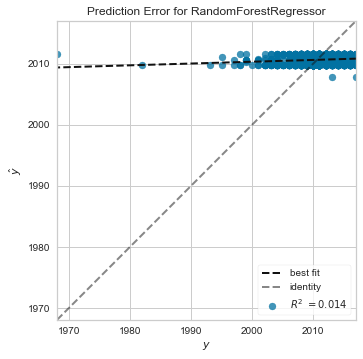

<AxesSubplot:title={'center':'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [137]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser1=PredictionError(RFls)
visualiser1.fit(X_train_ls,y_train_s)
visualiser1.score(X_test_ls,y_test_s)
visualiser1.poof()

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


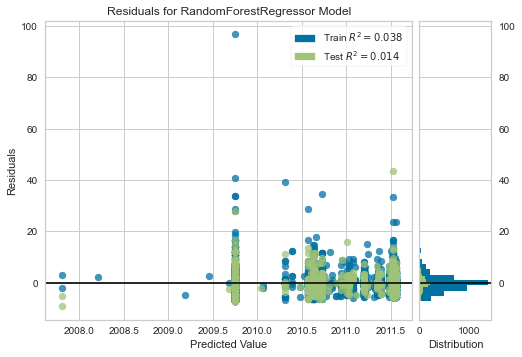

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [138]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer1=ResidualsPlot(RFls)
visualizer1.fit(X_train_ls,y_train_s)
visualizer1.score(X_test_ls,y_test_s)
visualizer1.poof()

In [139]:
#pip install mlxtend

In [140]:
### feature selection with Wrapper Method (step forward selection)
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [141]:
model=LinearRegression()
sfs=SFS(model,
        k_features=50,
        forward=True,
        scoring='neg_mean_squared_error',
       ).fit(X_train_s,y_train_s)

In [142]:
features1=list(sfs.k_feature_names_)
features1

['v_49',
 'v_51',
 'v_59',
 'v_77',
 'v_79',
 'v_96',
 'v_133',
 'v_142',
 'v_154',
 'v_163',
 'v_186',
 'v_198',
 'v_224',
 'v_256',
 'v_271',
 'v_275',
 'v_280',
 'v_294',
 'v_298',
 'v_305',
 'v_317',
 'v_318',
 'v_321',
 'v_324',
 'v_332',
 'v_344',
 'v_379',
 'v_389',
 'v_394',
 'v_397',
 'v_400',
 'v_401',
 'v_404',
 'v_409',
 'v_413',
 'v_416',
 'v_426',
 'v_427',
 'v_440',
 'v_444',
 'v_451',
 'v_455',
 'v_456',
 'v_457',
 'v_468',
 'v_475',
 'v_477',
 'v_479',
 'v_506',
 'v_515']

In [143]:
features2=[]
for i in X_train_s.columns:
    if i not in features1:
        features2.append(i)
features2 
len(features2)

468

In [144]:
X_trainfs=X_train.drop(features2, axis=1)
X_testfs=X_test.drop(features2, axis=1)

In [145]:
### using Random forest
RFfs=RandomForestRegressor(n_estimators=100,random_state=0,max_depth=2).fit(X_trainfs,y_train_s)

In [146]:
RFfs.score(X_trainfs,y_train_s)
ytrfs_pred=RFfs.predict(X_trainfs)
ytefs_pred=RFfs.predict(X_testfs)

In [147]:
##train
print('Mean Absolute Error:', metrics.mean_absolute_error(y_train_s, ytrfs_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_train_s, ytrfs_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_train_s,ytrfs_pred)))
print('R-2:', metrics.r2_score(y_train_s, ytrfs_pred))

Mean Absolute Error: 2.548425785107815
Mean Square Error: 15.464293728872407
Root Mean Square Error: 3.9324666214568698
R-2: 0.057326727842949454


In [148]:
#evaluating on test
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test_s, ytefs_pred))
print('Mean Square Error:', metrics.mean_squared_error(y_test_s, ytefs_pred))
print('Root Mean Square Error:', np.sqrt(metrics.mean_squared_error(y_test_s, ytefs_pred)))
print('R-2:', metrics.r2_score(y_test_s, ytefs_pred))

Mean Absolute Error: 2.4803354318497997
Mean Square Error: 13.521141413821795
Root Mean Square Error: 3.6771104707122677
R-2: -0.007453413039081314


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


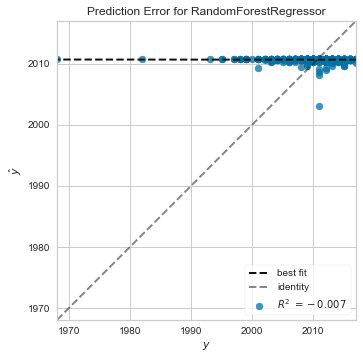

<AxesSubplot:title={'center':'Prediction Error for RandomForestRegressor'}, xlabel='$y$', ylabel='$\\hat{y}$'>

In [149]:
## plotting prediction error and residuals using yellowbrick
from yellowbrick.regressor import PredictionError
visualiser2=PredictionError(RFfs)
visualiser2.fit(X_trainfs,y_train_s)
visualiser2.score(X_testfs,y_test_s)
visualiser2.poof()

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


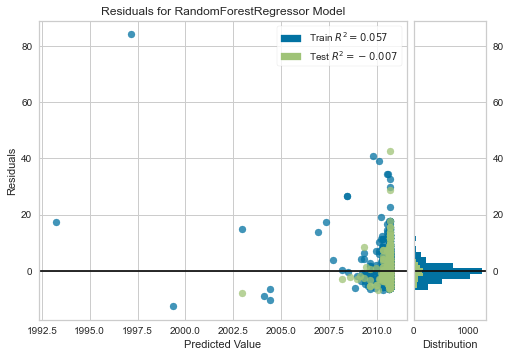

<AxesSubplot:title={'center':'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [150]:
## plotting the residuals
from yellowbrick.regressor import ResidualsPlot
visualizer2=ResidualsPlot(RFfs)
visualizer2.fit(X_trainfs,y_train_s)
visualizer2.score(X_testfs,y_test_s)
visualizer2.poof()